# ESM-FCN BE
---
## Predicted vs Measured
### Extracting the values
This was performed in the script `fig3-esm_mlm_fcn_be-r2_values.py`.

### Extracting Wildtype Binding and Expression 
To have our comparison to the wildtype values, we need to extract the predictions. We'll find the average value for each binding and expression and plot them on the scatter plot. From this, we can get the R^2 values.

In [1]:
import os
import pandas as pd

data_dir = "../../../../data/dms/original"
binding_df = pd.read_csv(os.path.join(data_dir, "binding_Kds.csv"), sep=',', header=0)
binding_df = binding_df.dropna(subset=['log10Ka']).reset_index(drop=True)
wildtype_b_df = binding_df[binding_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_b_df = wildtype_b_df[['target', 'variant_class', 'aa_substitutions', 'log10Ka']].copy()
wildtype_b_df['mean_log10Ka'] = wildtype_b_df.groupby('target')['log10Ka'].transform('mean')
binding_wt = wildtype_b_df['mean_log10Ka'][8] 

expression_df = pd.read_csv(os.path.join(data_dir, "expression_meanFs.csv"), sep=',', header=0)
expression_df = expression_df.dropna(subset=['ML_meanF']).reset_index(drop=True)
wildtype_e_df = expression_df[expression_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_e_df = wildtype_e_df[['target', 'variant_class', 'aa_substitutions', 'ML_meanF']].copy()
wildtype_e_df['mean_ML_meanF'] = wildtype_e_df.groupby('target')['ML_meanF'].transform('mean')
expression_wt = wildtype_e_df['mean_ML_meanF'][11]

print(f"WT binding: {binding_wt}, WT expression: {expression_wt}")

WT binding: 10.792732335537766, WT expression: 10.29234282907662


### Plotting Predicted vs Measured Scatterplot

In [2]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

def plot_predicted_value_scatter_with_threshold(merged_df, binding_or_expression, title, save_path, wt_loc, threshold_percent=10):
    sns.set_style('ticks')
    sns.set_context('poster')
    plt.figure(figsize=(16, 10.25))
    ax = plt.gca()

    if binding_or_expression.lower() == "binding":
        measured = "binding_measured_value"
        predicted = "binding_predicted_value"
    elif binding_or_expression.lower() == "expression":
        measured = "expression_measured_value"
        predicted = "expression_predicted_value"

    # Calculate R² for test data
    test_all_df = merged_df[merged_df['mode'] == 'test']
    r2_value = r2_score(test_all_df[measured], test_all_df[predicted])
    print(f"R^2: {r2_value}")

    # Calculate the threshold as 10% of measured values
    merged_df['threshold'] = merged_df[measured] * (threshold_percent/100)
    merged_df['abs_diff'] = np.abs(merged_df[measured] - merged_df[predicted])
    
    # Separate data based on the relative threshold
    within_threshold = merged_df[merged_df['abs_diff'] <= merged_df['threshold']]
    outside_threshold = merged_df[merged_df['abs_diff'] > merged_df['threshold']]

    test_outside_df = outside_threshold[outside_threshold['mode'] == 'test']
    r2_outside_value = r2_score(test_outside_df[measured], test_outside_df[predicted])
    print(f"R^2 outside of threshold: {r2_outside_value}")

    test_inside_df = within_threshold[within_threshold['mode'] == 'test']
    r2_inside_value = r2_score(test_inside_df[measured], test_inside_df[predicted])
    print(f"R^2 inside of threshold: {r2_inside_value}")

    # Plot train and test data within threshold
    marker_size = 35

    test_df = within_threshold[within_threshold['mode'] == 'test']
    sns.scatterplot(
        x=test_df[measured],
        y=test_df[predicted],
        s=marker_size,
        color="tab:orange",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Test =<10%"
    )

    train_df = within_threshold[within_threshold['mode'] == 'train']
    sns.scatterplot(
        x=train_df[measured],
        y=train_df[predicted],
        s=marker_size,
        color="tab:blue",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Train =<10%"
    )

    # Plot train and test data outside threshold (greyed out)
    sns.scatterplot(
        data=outside_threshold,
        x=measured,
        y=predicted,
        s=marker_size,
        color="gray",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label=">10%"
    )

    # Add vertical line wildtype loc
    plt.axvline(x=wt_loc, color='black', linestyle='-', linewidth=2)
    plt.text(
        wt_loc, 4.5, 'wt', 
        verticalalignment='bottom',
        horizontalalignment='center',
        )

    plt.xlim(5.25, 11.5)
    plt.ylim(5.25, 11.5)
    plt.xlabel(f"Measured {binding_or_expression}")
    plt.ylabel(f"Predicted {binding_or_expression}")
    plt.title(f"{title}\nR² = {r2_value:.4f}")
    plt.legend(loc="upper left", markerscale=3)
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.grid(axis="x", linestyle="--", alpha=0.7)

    plt.savefig(f"{save_path}.pdf", format='pdf', dpi=600, bbox_inches='tight')
    plt.savefig(f"{save_path}.png", format='png', dpi=600, bbox_inches='tight')
    return r2_value

R^2: 0.049236483278325416
R^2 outside of threshold: 0.04186462588413631
R^2 inside of threshold: 0.4026907373617681


R^2: 0.041251343399833496
R^2 outside of threshold: 0.03547123292593446
R^2 inside of threshold: 0.32011722895065187
R^2: 0.6965006023248876
R^2 outside of threshold: -0.26333059347440635
R^2 inside of threshold: 0.9482552509089373
R^2: 0.7069049150215178
R^2 outside of threshold: -0.5617313157052473
R^2 inside of threshold: 0.9555045885993138
R^2: 0.12588319273847792
R^2 outside of threshold: 0.07167906875873675
R^2 inside of threshold: 0.8338666957198224
R^2: 0.10794873740724786
R^2 outside of threshold: 0.07523769610158737
R^2 inside of threshold: 0.7695969098020701
R^2: 0.7028856152842846
R^2 outside of threshold: -0.8307051443413953
R^2 inside of threshold: 0.9594942638033932
R^2: 0.7063174244705397
R^2 outside of threshold: -0.6377717612857812
R^2 inside of threshold: 0.957195889842011


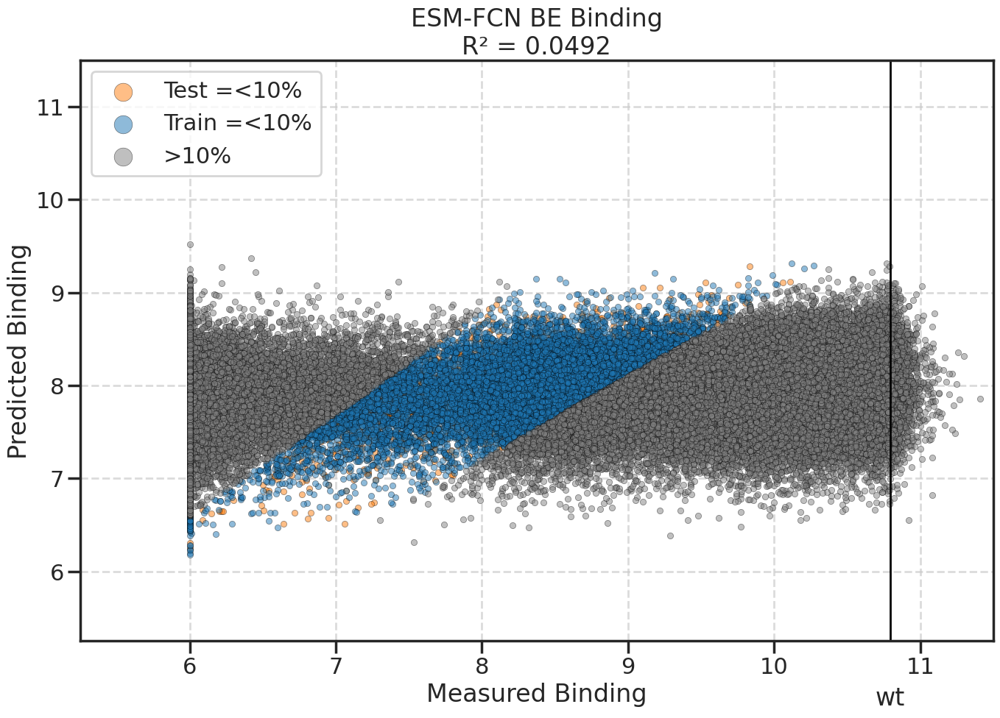

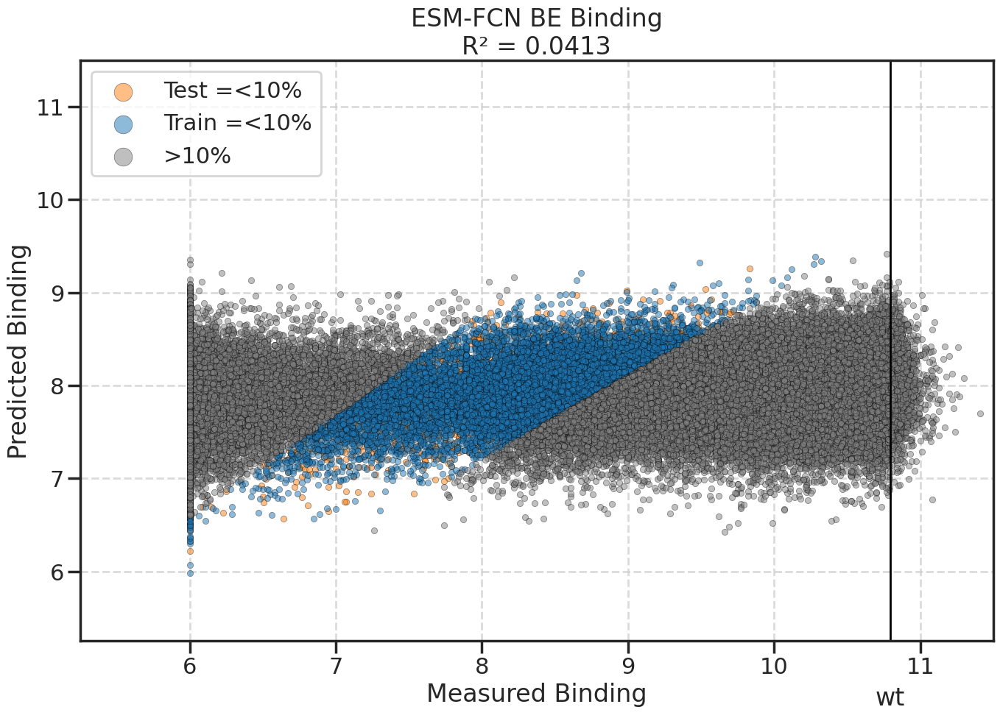

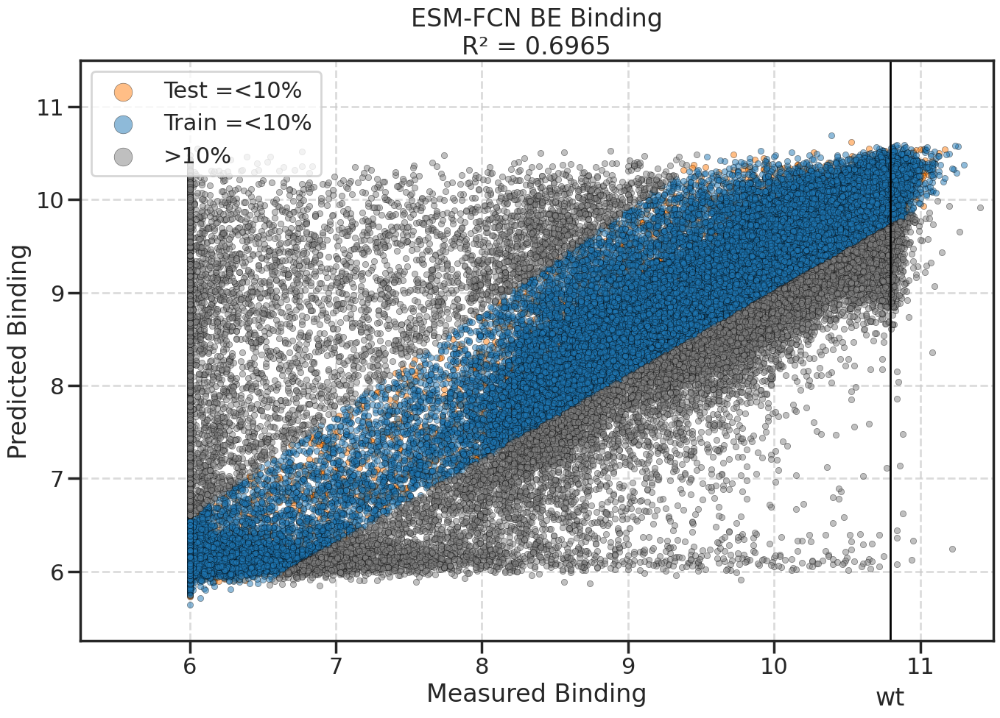

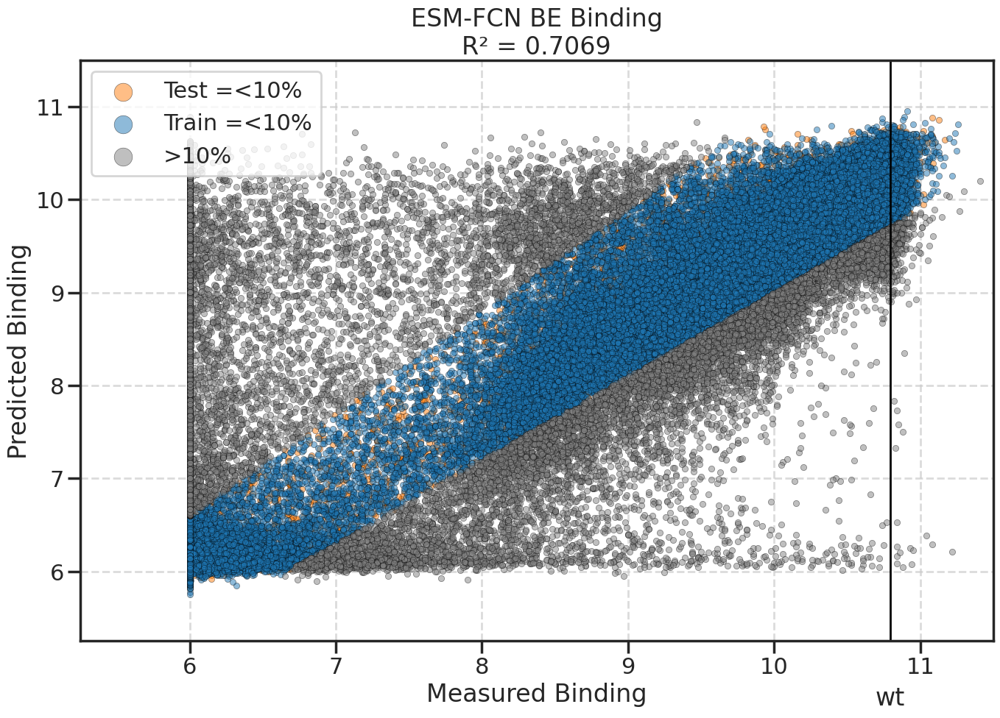

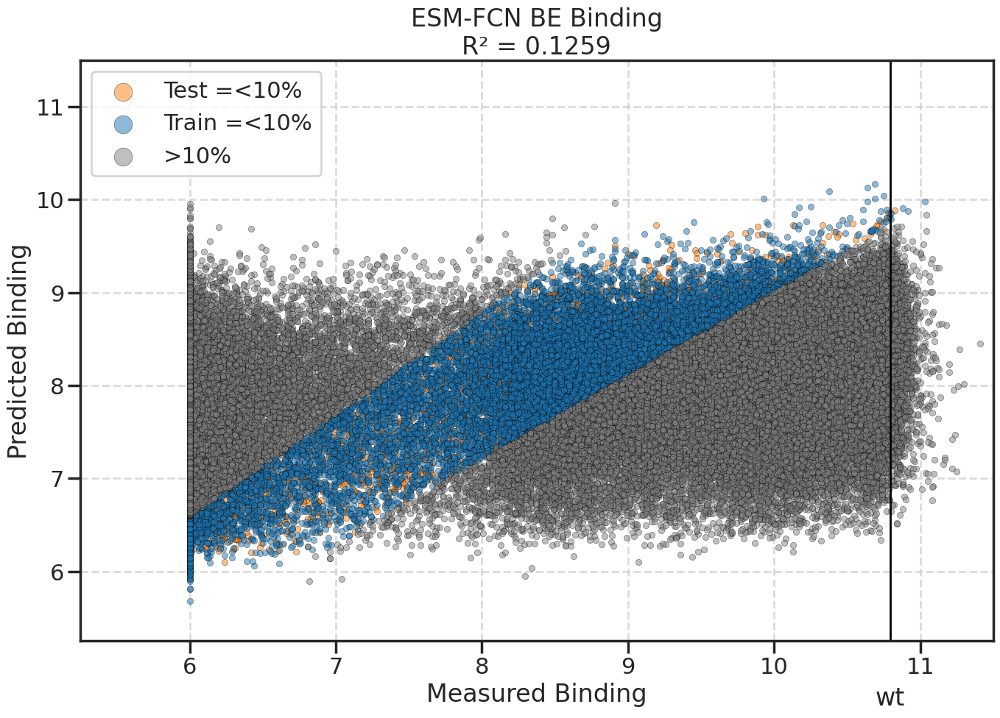

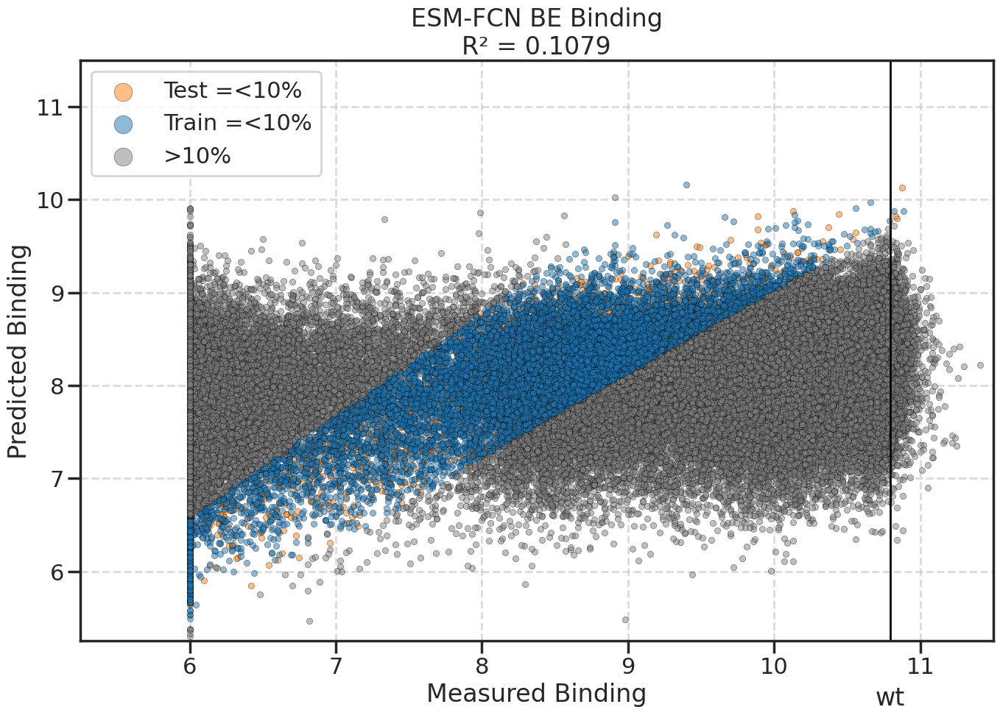

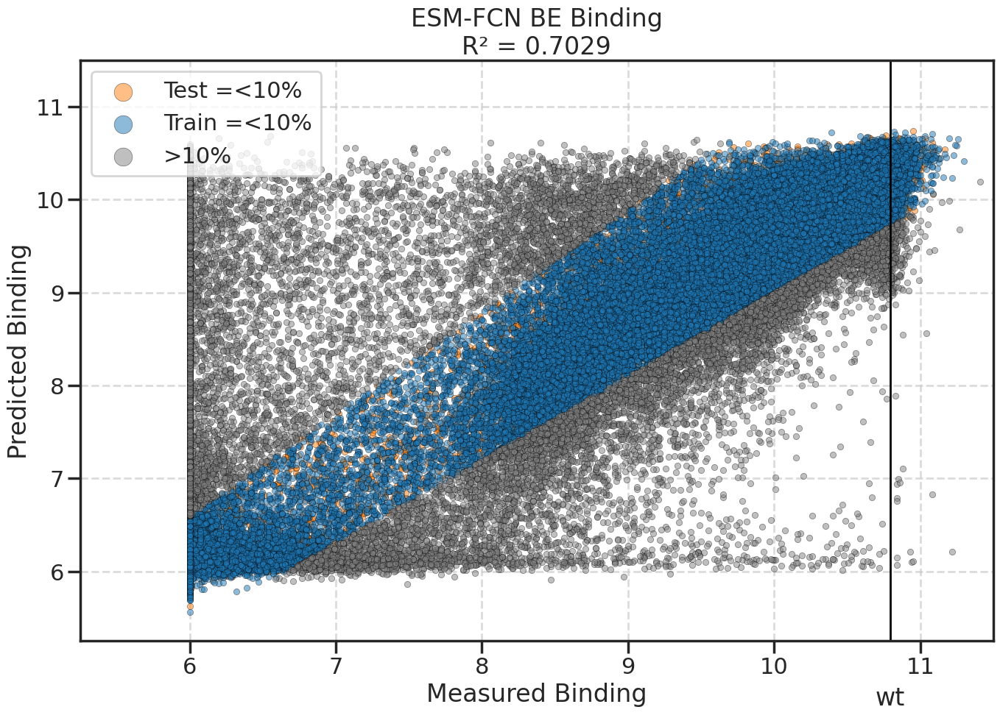

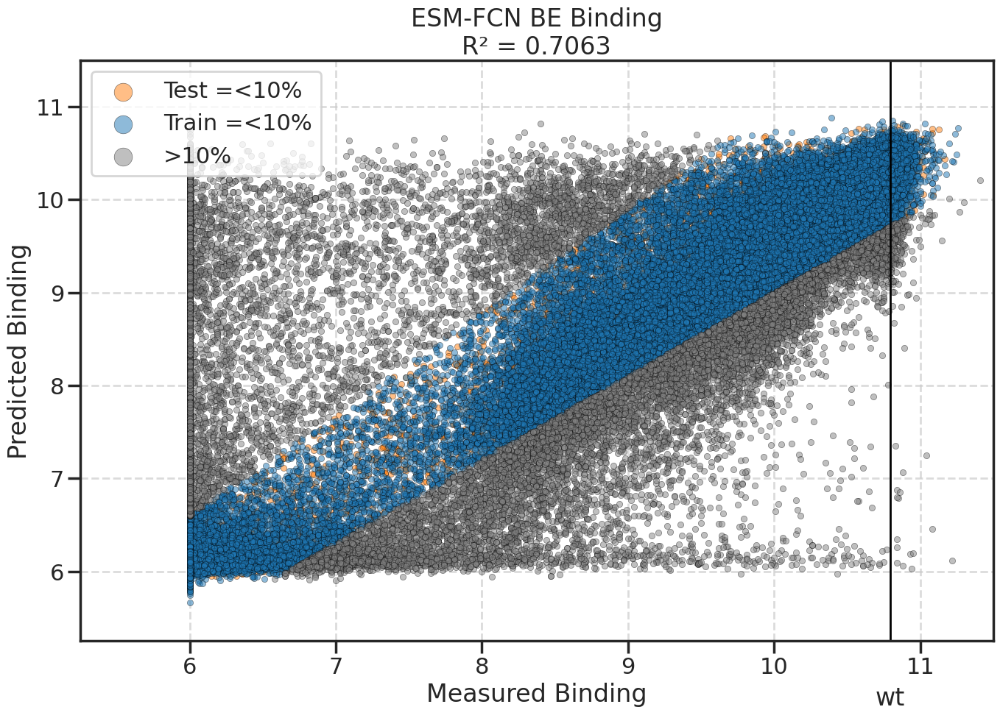

In [3]:
# Binding
df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.A-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_a_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_mlm_fcn_be/esm_mlm_fcn_be.A.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.B-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_b_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_mlm_fcn_be/esm_mlm_fcn_be.B.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.C-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_c_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_mlm_fcn_be/esm_mlm_fcn_be.C.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.D-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_d_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_mlm_fcn_be/esm_mlm_fcn_be.D.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.E-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_e_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_mlm_fcn_be/esm_mlm_fcn_be.E.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.F-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_f_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_mlm_fcn_be/esm_mlm_fcn_be.F.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.G-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_g_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_mlm_fcn_be/esm_mlm_fcn_be.G.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.H-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_h_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-FCN BE Binding", "esm_mlm_fcn_be/esm_mlm_fcn_be.H.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.04321240277896665
R^2 outside of threshold: -0.04537528768805399
R^2 inside of threshold: 0.030500371541312465
R^2: 0.032394547850819966
R^2 outside of threshold: -0.04968465052879356
R^2 inside of threshold: -0.011210895185726377
R^2: 0.658244218523631
R^2 outside of threshold: -0.38195119215016926
R^2 inside of threshold: 0.8402642772546542
R^2: 0.6576499899927619
R^2 outside of threshold: -0.4824007141840565
R^2 inside of threshold: 0.8430121130272608
R^2: 0.10631280919157271
R^2 outside of threshold: -0.029947781206276503
R^2 inside of threshold: 0.28035179326534043
R^2: 0.08568893257553223
R^2 outside of threshold: -0.011845372610171045
R^2 inside of threshold: 0.18988277027647327
R^2: 0.6514339370755118
R^2 outside of threshold: -1.0514885050590617
R^2 inside of threshold: 0.8529330363689221


R^2: 0.6613956748908142
R^2 outside of threshold: -1.1235995533616192
R^2 inside of threshold: 0.8611464930464123


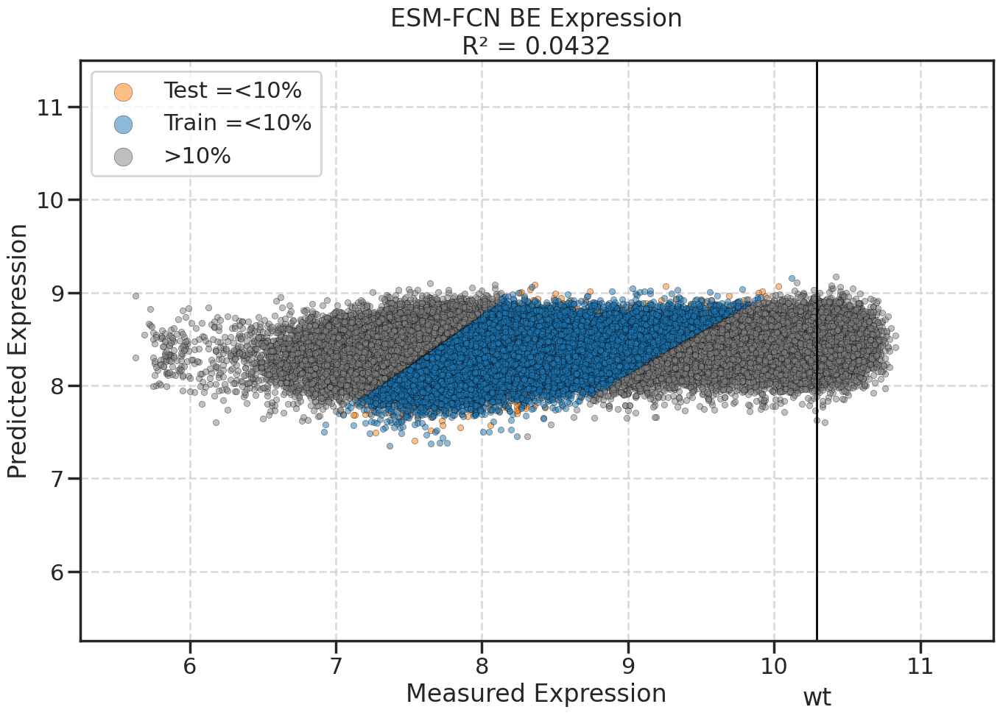

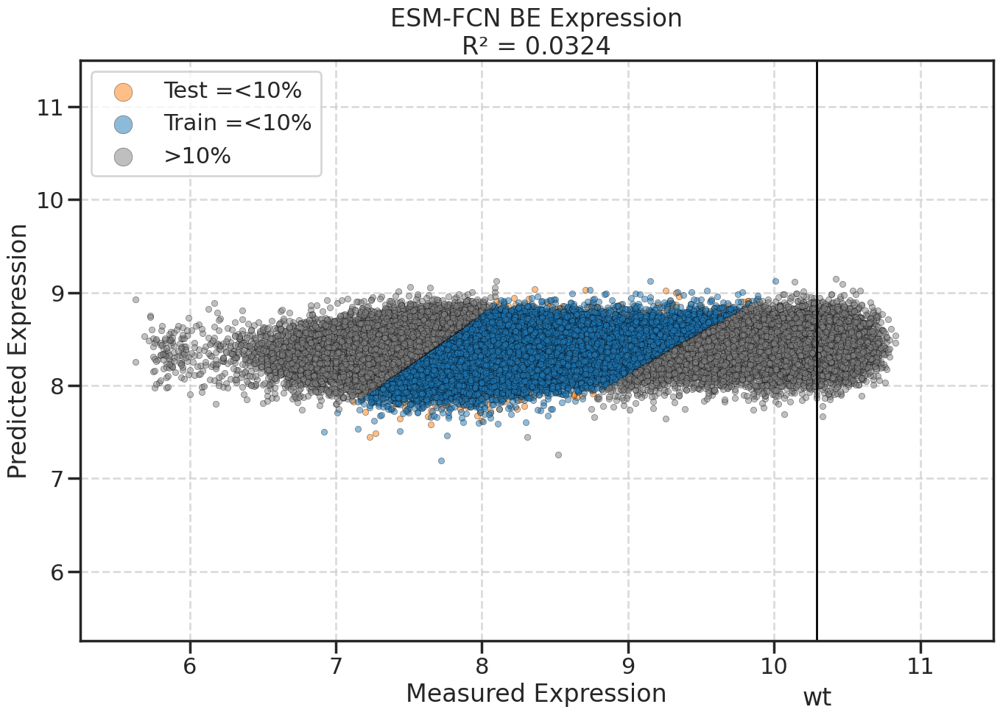

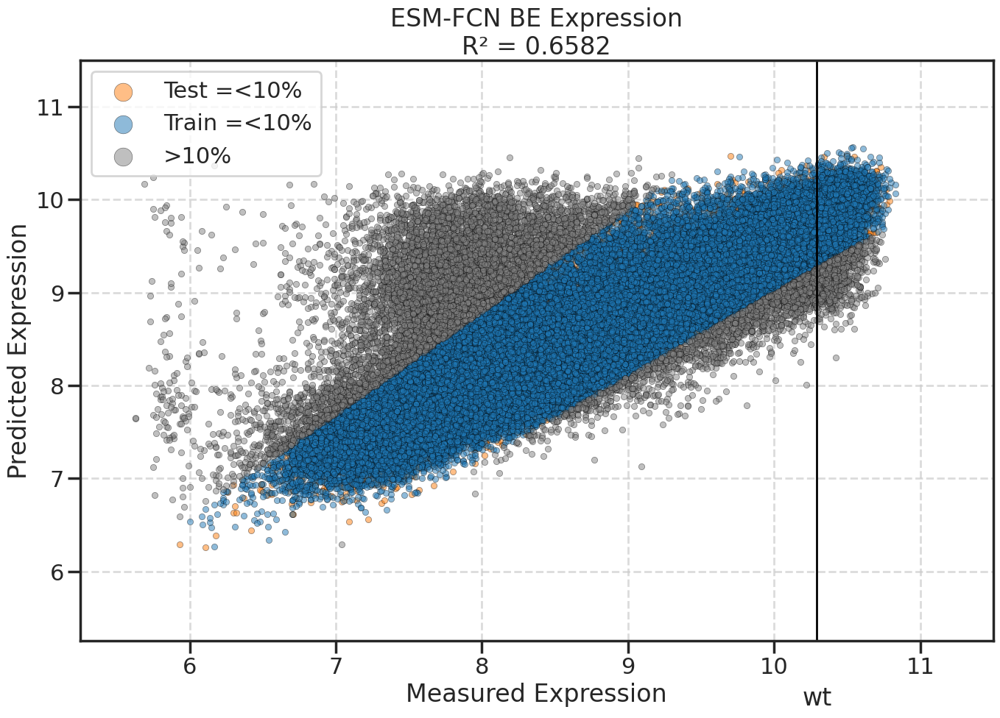

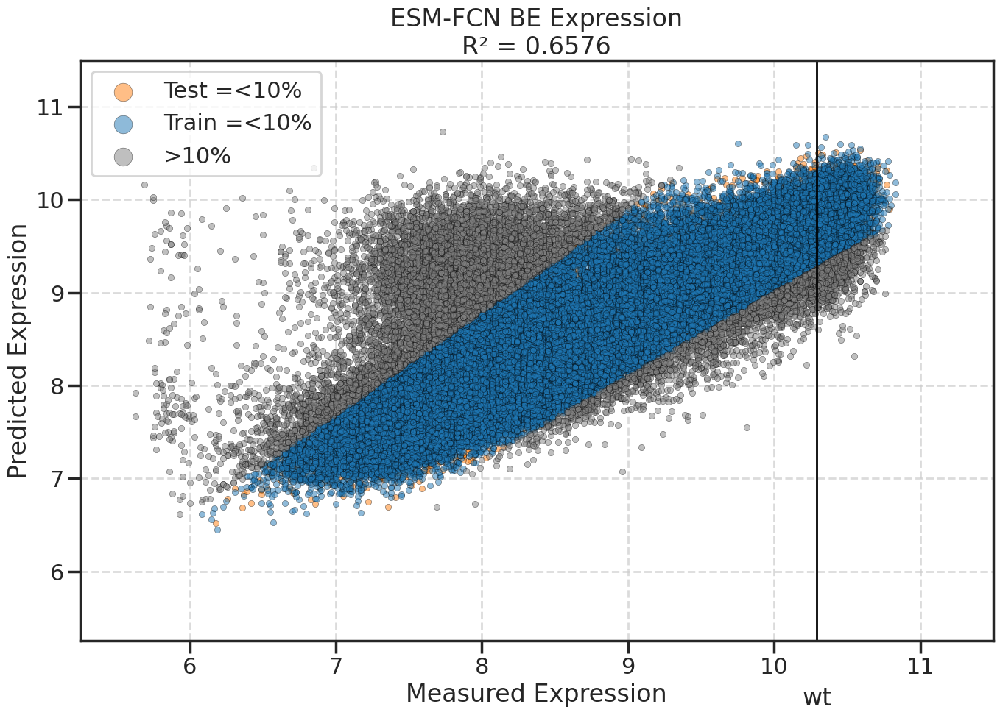

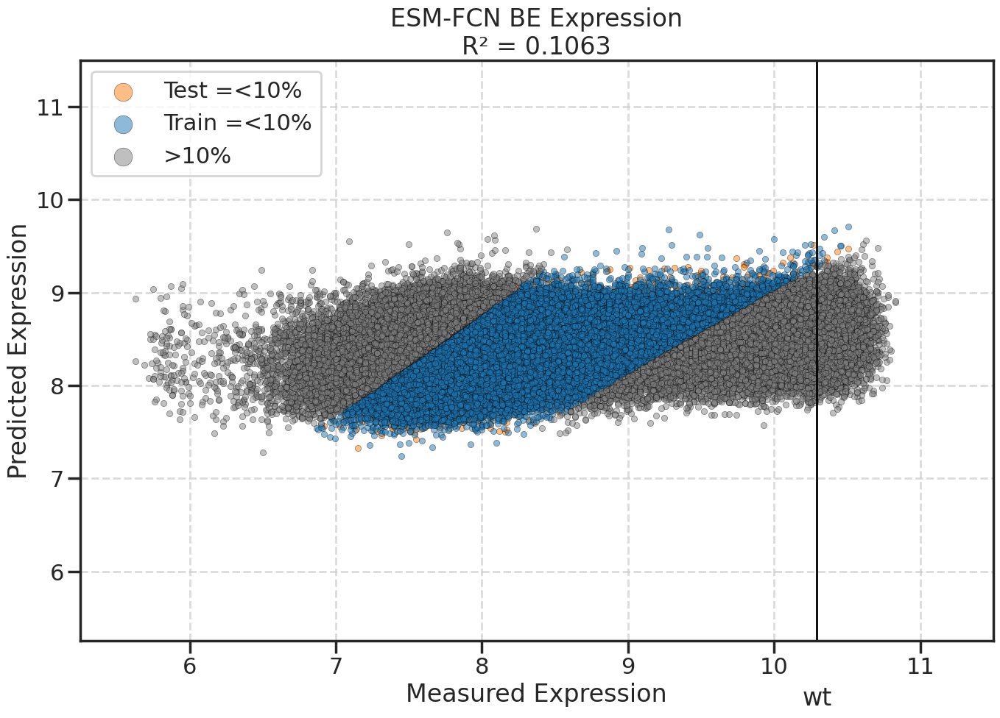

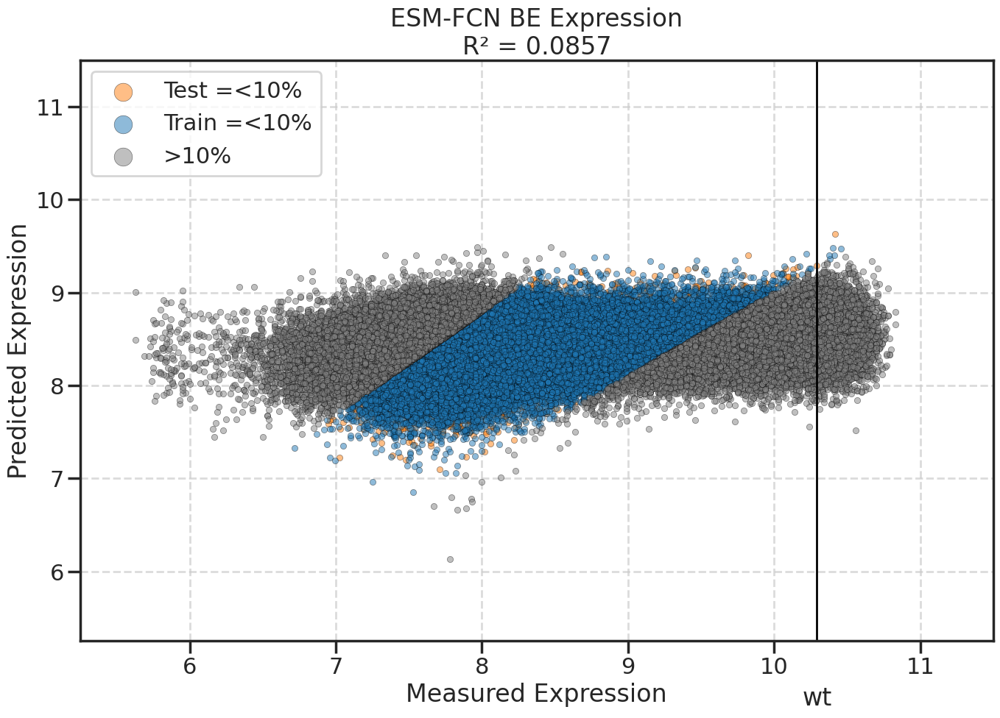

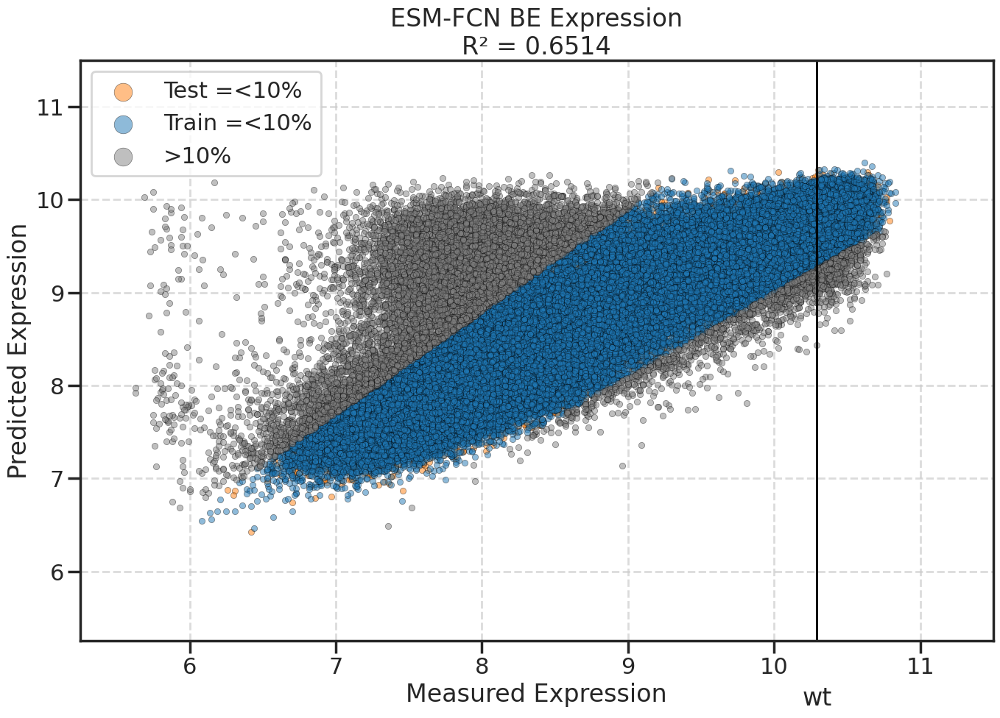

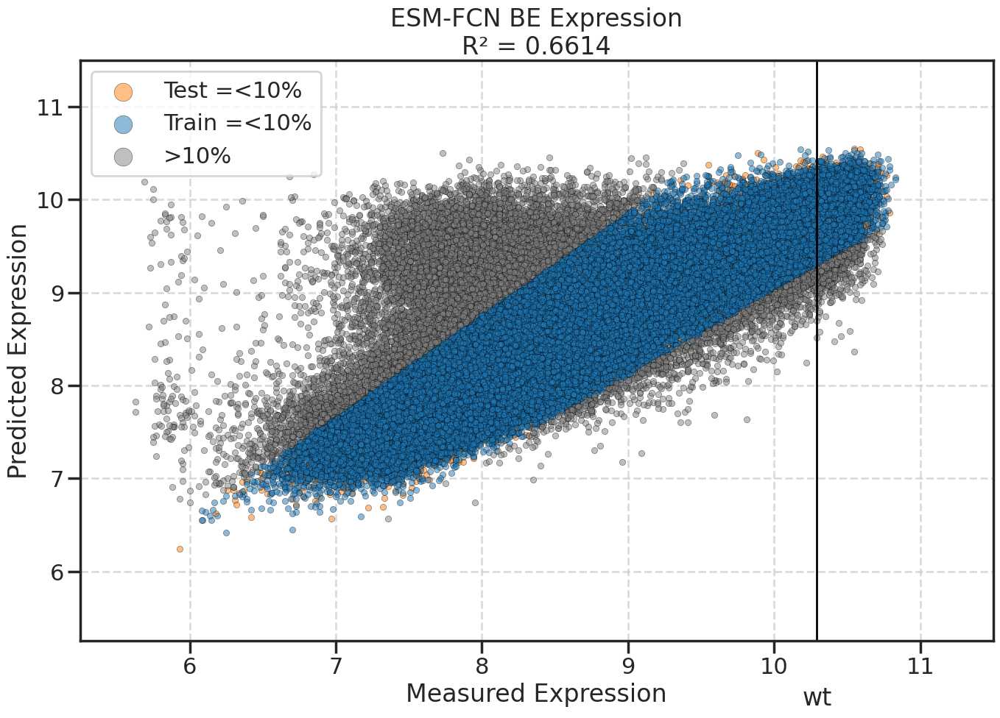

In [4]:
# Expression
df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.A-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_a_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_mlm_fcn_be/esm_mlm_fcn_be.A.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.B-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_b_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_mlm_fcn_be/esm_mlm_fcn_be.B.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.C-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_c_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_mlm_fcn_be/esm_mlm_fcn_be.C.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.D-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_d_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_mlm_fcn_be/esm_mlm_fcn_be.D.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.E-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_e_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_mlm_fcn_be/esm_mlm_fcn_be.E.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.F-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_f_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_mlm_fcn_be/esm_mlm_fcn_be.F.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.G-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_g_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_mlm_fcn_be/esm_mlm_fcn_be.G.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("esm_mlm_fcn_be/esm_mlm_fcn_be.H-predicted_vs_measured.values.csv")
esm_mlm_fcn_be_h_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-FCN BE Expression", "esm_mlm_fcn_be/esm_mlm_fcn_be.H.expression-predicted_vs_measured.scatter", expression_wt)

---
### Bar Chart Stats

In [5]:
r2_dict = {
    "A.binding": esm_mlm_fcn_be_a_binding,
    "A.expression": esm_mlm_fcn_be_a_expression,
    "B.binding": esm_mlm_fcn_be_b_binding,
    "B.expression": esm_mlm_fcn_be_b_expression,
    "C.binding": esm_mlm_fcn_be_c_binding,
    "C.expression": esm_mlm_fcn_be_c_expression,
    "D.binding": esm_mlm_fcn_be_d_binding,
    "D.expression": esm_mlm_fcn_be_d_expression,
    "E.binding": esm_mlm_fcn_be_e_binding,
    "E.expression": esm_mlm_fcn_be_e_expression,
    "F.binding": esm_mlm_fcn_be_f_binding,
    "F.expression": esm_mlm_fcn_be_f_expression,
    "G.binding": esm_mlm_fcn_be_g_binding,
    "G.expression": esm_mlm_fcn_be_g_expression,
    "H.binding": esm_mlm_fcn_be_h_binding,
    "H.expression": esm_mlm_fcn_be_h_expression
}
for key, value in r2_dict.items():
    print(f"{key}: {value}")

A.binding: 0.049236483278325416
A.expression: 0.04321240277896665
B.binding: 0.041251343399833496
B.expression: 0.032394547850819966
C.binding: 0.6965006023248876
C.expression: 0.658244218523631
D.binding: 0.7069049150215178
D.expression: 0.6576499899927619
E.binding: 0.12588319273847792
E.expression: 0.10631280919157271
F.binding: 0.10794873740724786
F.expression: 0.08568893257553223
G.binding: 0.7028856152842846
G.expression: 0.6514339370755118
H.binding: 0.7063174244705397
H.expression: 0.6613956748908142
